In [1]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
data_process.download_data()

input_size = 300

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



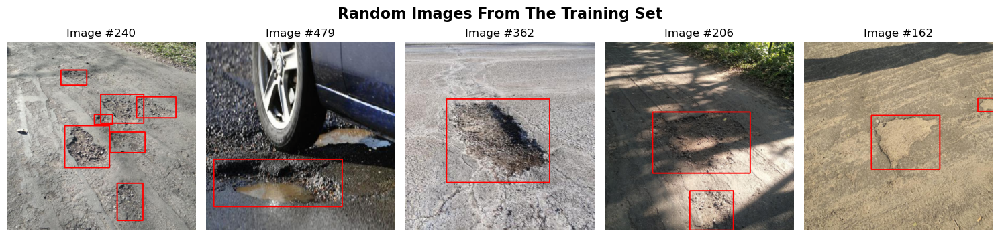

In [4]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

In [3]:
history = trainer.train_from_config(model_config_path="data/models/ssd300_vgg16/ssd300_vgg16_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/", kornia_aug=False)

Starting training for ssd300_vgg16 with the following parameters:
{'batch_size': 5, 'epochs': 20, 'preweight_mode': 'fine_tuning', 'optimizer': 'AdamW', 'lr': 0.0009467475340372642, 'beta1': 0.8834165199724515, 'beta2': 0.9690194026386639, 'weight_decay': 0.0015812143275965708, 'scheduler': 'OneCycleLR', 'max_lr': 0.002747758441042921}
Epoch 1/20, Train Loss: 498.0067, Val mAP@50: 0.0000, FPS: 236.53, Epoch Time: 5.64 seconds
Epoch 2/20, Train Loss: 369.4236, Val mAP@50: 0.0891, FPS: 272.90, Epoch Time: 5.26 seconds
Epoch 3/20, Train Loss: 290.1614, Val mAP@50: 0.3620, FPS: 272.65, Epoch Time: 5.27 seconds
Epoch 4/20, Train Loss: 237.7559, Val mAP@50: 0.4050, FPS: 273.73, Epoch Time: 5.27 seconds
Epoch 5/20, Train Loss: 193.3732, Val mAP@50: 0.4297, FPS: 273.54, Epoch Time: 5.22 seconds
Epoch 6/20, Train Loss: 168.5484, Val mAP@50: 0.4824, FPS: 273.57, Epoch Time: 5.22 seconds
Epoch 7/20, Train Loss: 148.1493, Val mAP@50: 0.4966, FPS: 273.92, Epoch Time: 5.23 seconds
Epoch 8/20, Train 

Mean Average Precision @ 0.5 : 0.4972 FPS: 253.35


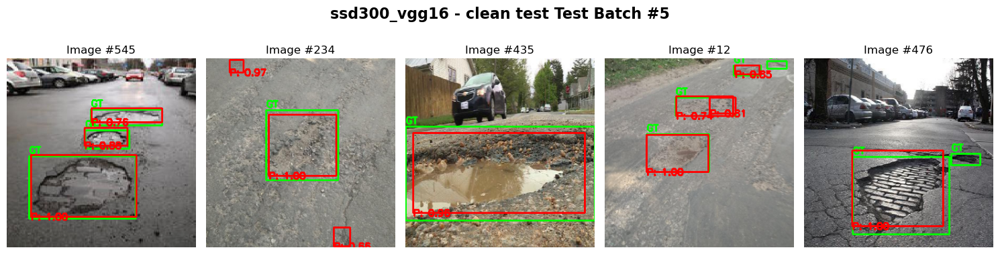

Mean Average Precision @ 0.5 : 0.3654 FPS: 252.89


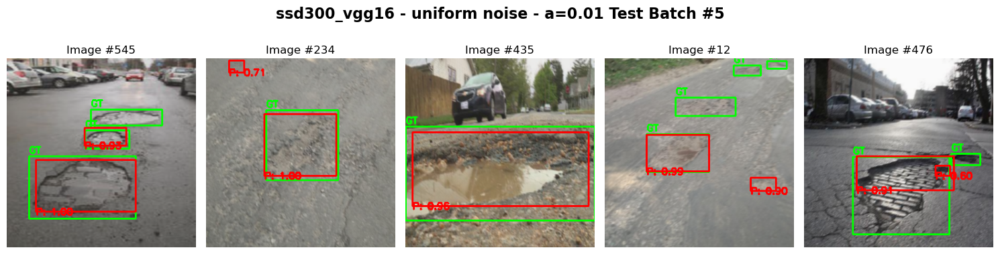

Mean Average Precision @ 0.5 : 0.0755 FPS: 258.19


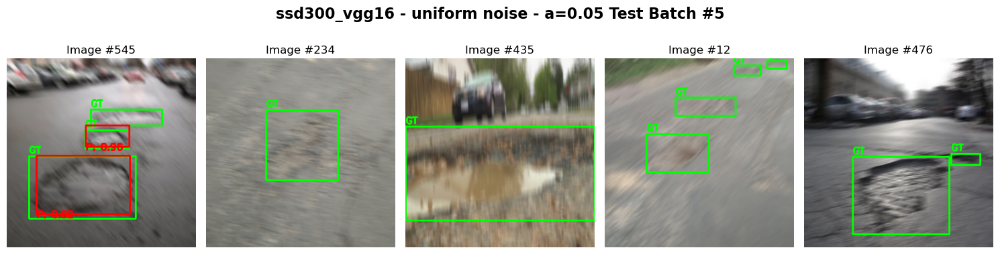

Mean Average Precision @ 0.5 : 0.0066 FPS: 266.01


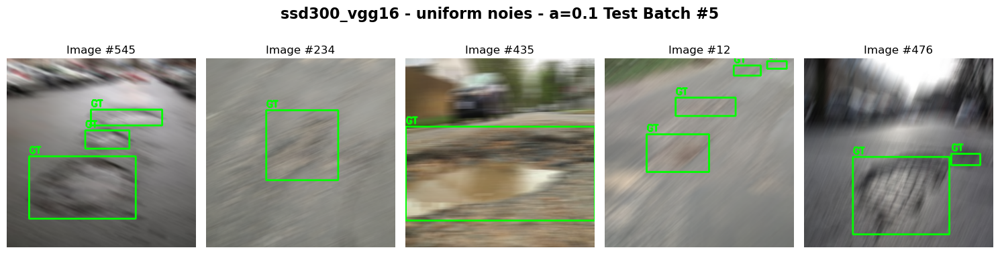

Mean Average Precision @ 0.5 : 0.3349 FPS: 252.27


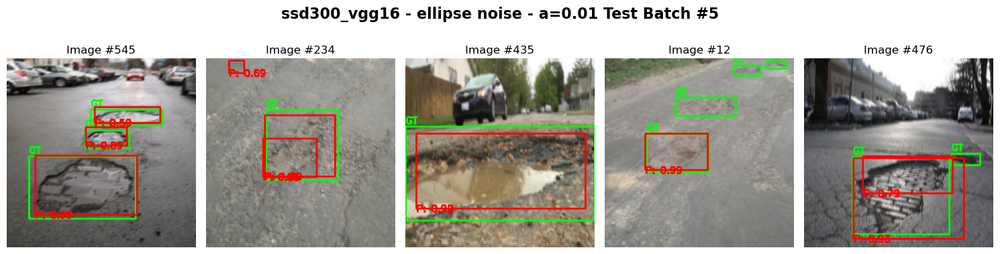

Mean Average Precision @ 0.5 : 0.0717 FPS: 262.21


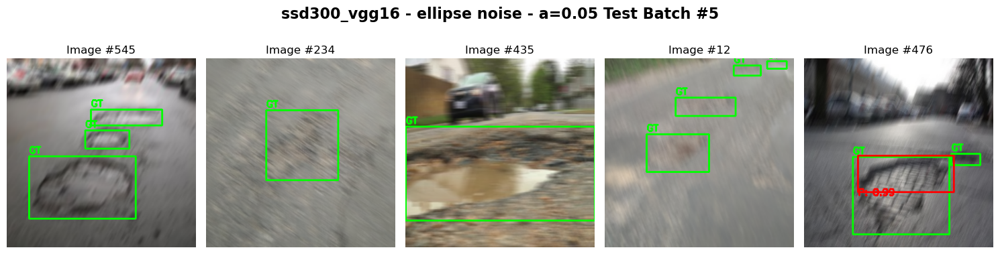

Mean Average Precision @ 0.5 : 0.0173 FPS: 265.47


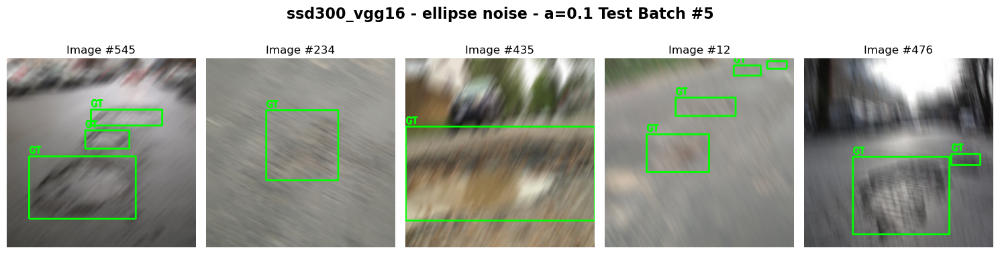

Mean Average Precision @ 0.5 : 0.2121 FPS: 259.94


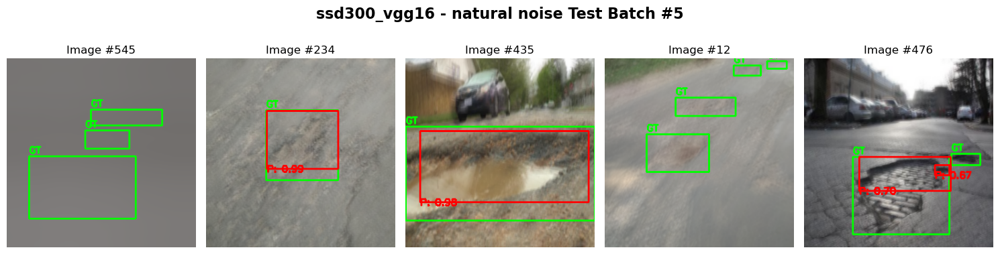

In [10]:
model_name = "ssd300_vgg16"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/ssd300_vgg16_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssd300_vgg16 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssd300_vgg16 - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssd300_vgg16 - natural noise")

In [6]:
utils.update_json(history, model_name="ssd300_vgg16")

In [7]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="data/models/ssd300_vgg16/ssd300_vgg16_best_params.json", train_set=train_set, val_set=val_set, save_path="./data/models/ssd300_vgg16/", kornia_aug=True)

Starting training for ssd300_vgg16 with the following parameters:
{'batch_size': 5, 'epochs': 20, 'preweight_mode': 'fine_tuning', 'optimizer': 'AdamW', 'lr': 0.0009467475340372642, 'beta1': 0.8834165199724515, 'beta2': 0.9690194026386639, 'weight_decay': 0.0015812143275965708, 'scheduler': 'OneCycleLR', 'max_lr': 0.002747758441042921}
Epoch 1/20, Train Loss: 476.4198, Val mAP@50: 0.0050, FPS: 273.24, Epoch Time: 5.45 seconds
Epoch 2/20, Train Loss: 363.1228, Val mAP@50: 0.2496, FPS: 272.88, Epoch Time: 5.44 seconds
Epoch 3/20, Train Loss: 319.8669, Val mAP@50: 0.3634, FPS: 272.98, Epoch Time: 5.44 seconds
Epoch 4/20, Train Loss: 283.6944, Val mAP@50: 0.3733, FPS: 272.74, Epoch Time: 5.43 seconds
Epoch 5/20, Train Loss: 267.4241, Val mAP@50: 0.3750, FPS: 272.49, Epoch Time: 5.47 seconds
Epoch 6/20, Train Loss: 242.0246, Val mAP@50: 0.4317, FPS: 271.58, Epoch Time: 5.49 seconds
Epoch 7/20, Train Loss: 232.2965, Val mAP@50: 0.4264, FPS: 271.45, Epoch Time: 5.48 seconds
Epoch 8/20, Train 

Mean Average Precision @ 0.5 : 0.4438 FPS: 252.01


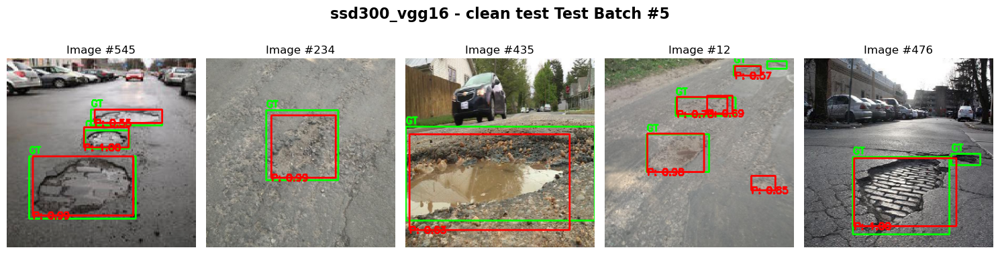

Mean Average Precision @ 0.5 : 0.4288 FPS: 250.84


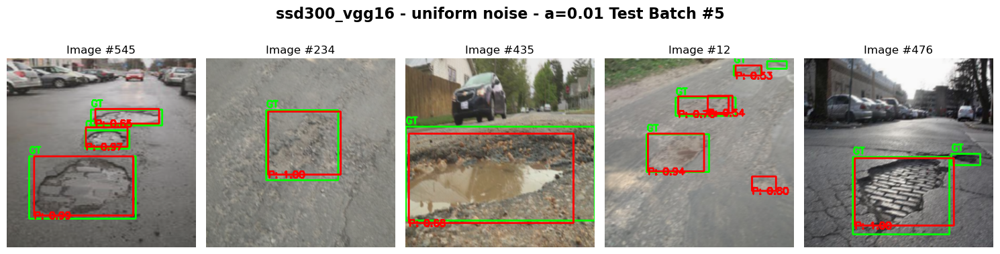

Mean Average Precision @ 0.5 : 0.3559 FPS: 249.70


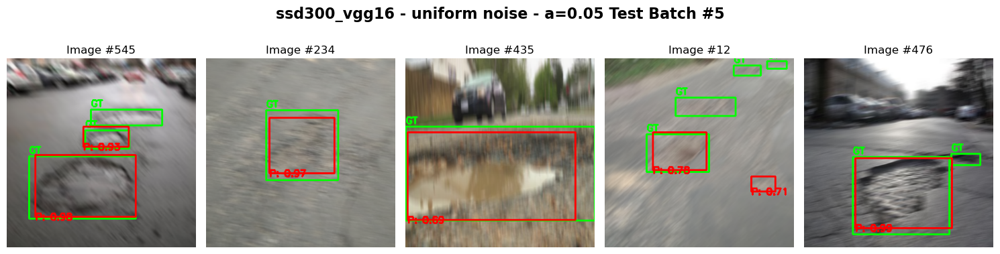

Mean Average Precision @ 0.5 : 0.2645 FPS: 255.84


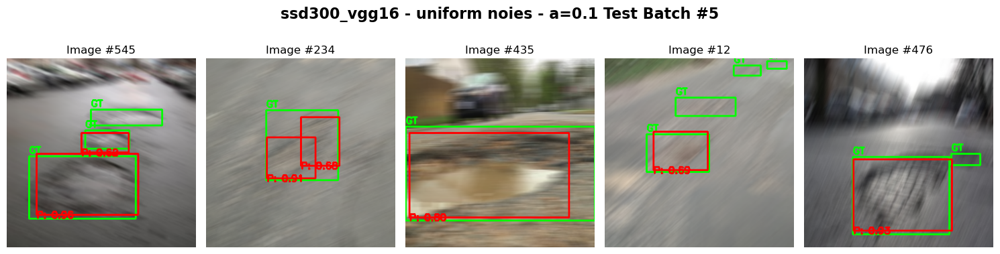

Mean Average Precision @ 0.5 : 0.4211 FPS: 253.68


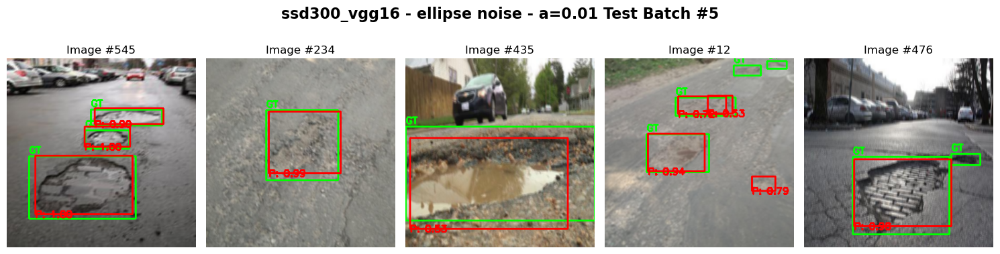

Mean Average Precision @ 0.5 : 0.3228 FPS: 253.05


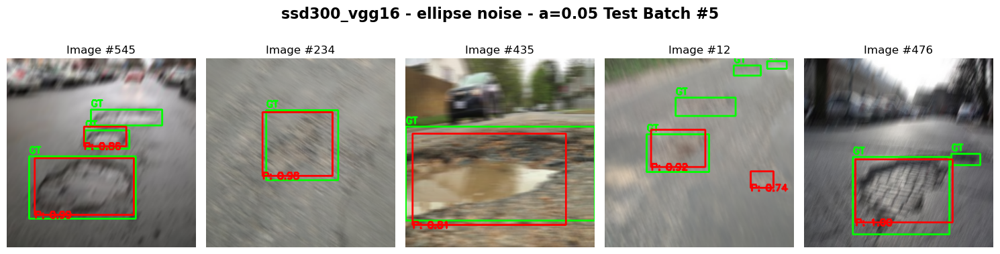

Mean Average Precision @ 0.5 : 0.2337 FPS: 251.39


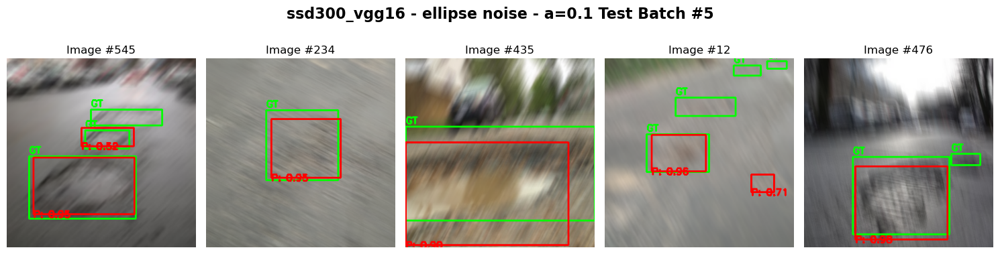

Mean Average Precision @ 0.5 : 0.3197 FPS: 250.63


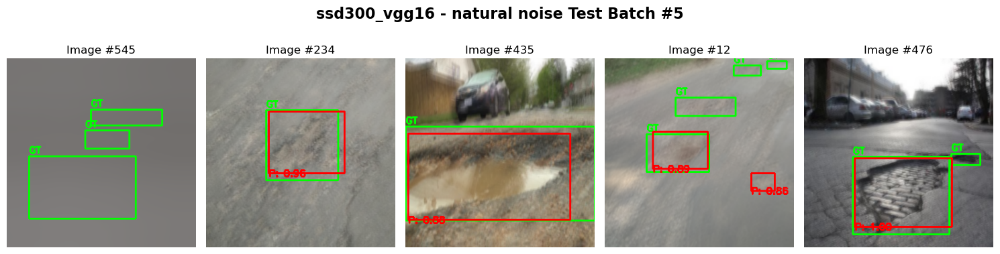

In [8]:
model_name = "ssd300_vgg16"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/ssd300_vgg16/ssd300_vgg16_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="ssd300_vgg16 - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="ssd300_vgg16 - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="ssd300_vgg16 - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="ssd300_vgg16 - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="ssd300_vgg16 - natural noise")

In [9]:
utils.update_json(history, model_name="ssd300_vgg16_aug")